In [ ]:
# Gerekli kütüphanelerin yüklenmesi
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from skimage import io, color, filters, exposure, morphology
from skimage.filters import try_all_threshold, threshold_otsu
from skimage.measure import regionprops, label

In [ ]:
!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 22.11 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis


In [ ]:
%ls nih/

densenet.hdf5  images_small/  pretrained_model.h5  test.csv  train-small.csv  valid-small.csv


In [ ]:
%ls nih/images_small

00000003_001.png  00006043_000.png  00011570_000.png  00016732_001.png  00022899_031.png
00000020_001.png  00006053_000.png  00011579_036.png  00016747_001.png  00022957_005.png
00000022_000.png  00006081_001.png  00011583_008.png  00016784_000.png  00022965_004.png
00000032_039.png  00006097_002.png  00011584_002.png  00016807_008.png  00022982_000.png
00000099_013.png  00006104_000.png  00011587_006.png  00016813_004.png  00022993_006.png
00000103_000.png  00006192_010.png  00011598_037.png  00016825_001.png  00023027_000.png
00000111_000.png  00006198_000.png  00011632_019.png  00016832_000.png  00023065_003.png
00000116_034.png  00006229_000.png  00011649_005.png  00016860_000.png  00023069_002.png
00000121_008.png  00006234_000.png  00011683_023.png  00016882_004.png  00023079_002.png
00000138_002.png  00006272_000.png  00011696_003.png  00016934_027.png  00023116_004.png
00000248_021.png  00006297_003.png  00011702_082.png  00016952_000.png  00023124_002.png
00000284_005.png  000

In [ ]:
# Veri setini yükleme
train_df = pd.read_csv("nih/train-small.csv")
print(f'There are {train_df.shape[0]} rows and {train_df.shape[1]} columns in this data frame')
train_df.head()

There are 1000 rows and 16 columns in this data frame


,Image,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,PatientId,Pleural_Thickening,Pneumonia,Pneumothorax
0,00008270_015.png,0,0,0,0,0,0,0,0,0,0,0,8270,0,0,0
1,00029855_001.png,1,0,0,0,1,0,0,0,1,0,0,29855,0,0,0
2,00001297_000.png,0,0,0,0,0,0,0,0,0,0,0,1297,1,0,0
3,00012359_002.png,0,0,0,0,0,0,0,0,0,0,0,12359,0,0,0
4,00017951_001.png,0,0,0,0,0,0,0,0,1,0,0,17951,0,0,0


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Image               1000 non-null   object
 1   Atelectasis         1000 non-null   int64 
 2   Cardiomegaly        1000 non-null   int64 
 3   Consolidation       1000 non-null   int64 
 4   Edema               1000 non-null   int64 
 5   Effusion            1000 non-null   int64 
 6   Emphysema           1000 non-null   int64 
 7   Fibrosis            1000 non-null   int64 
 8   Hernia              1000 non-null   int64 
 9   Infiltration        1000 non-null   int64 
 10  Mass                1000 non-null   int64 
 11  Nodule              1000 non-null   int64 
 12  PatientId           1000 non-null   int64 
 13  Pleural_Thickening  1000 non-null   int64 
 14  Pneumonia           1000 non-null   int64 
 15  Pneumothorax        1000 non-null   int64 
dtypes: int64(15), object(1)
m

In [ ]:
# Rastgele 9 görüntü seçme
random_images = train_df.sample(9)['Image'].values
print(f"Random seçilen dosyalar: {random_images}")

Random seçilen dosyalar: ['00009920_004.png' '00013209_020.png' '00029593_000.png'
 '00028876_048.png' '00016034_001.png' '00004523_003.png'
 '00013003_027.png' '00000918_000.png' '00026500_000.png']


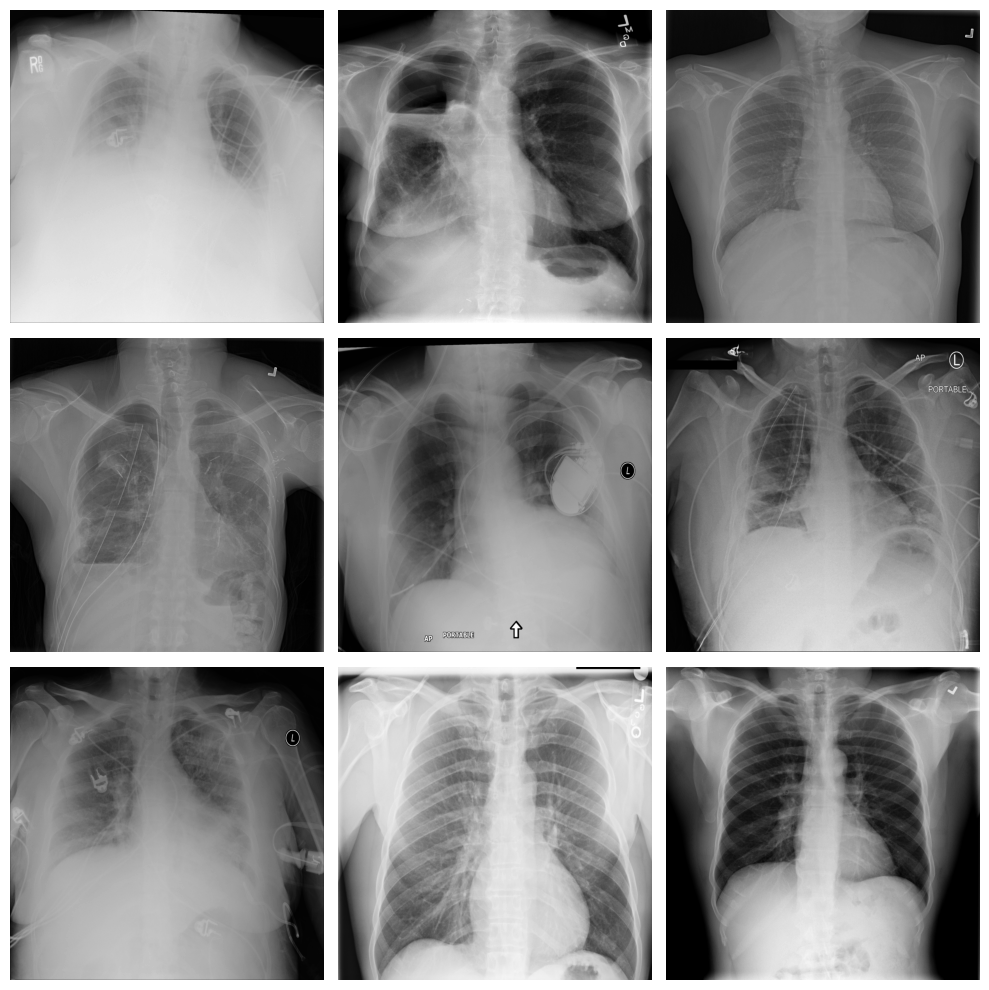

In [ ]:
# 3x3 Grid'de Görselleştirme
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i, img_name in enumerate(random_images):
    img_path = os.path.join("nih/images_small", img_name)
    if not os.path.exists(img_path):
        continue

    sample_image = io.imread(img_path)
    ax = axes[i // 3, i % 3]
    ax.imshow(sample_image, cmap='gray')
    ax.axis('off')
plt.tight_layout()
plt.show()

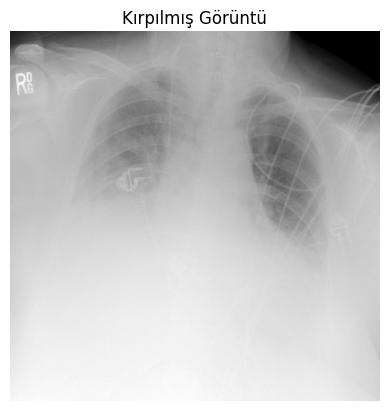

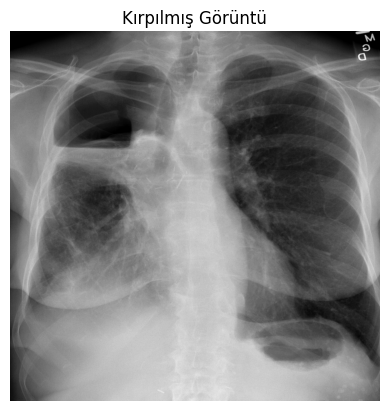

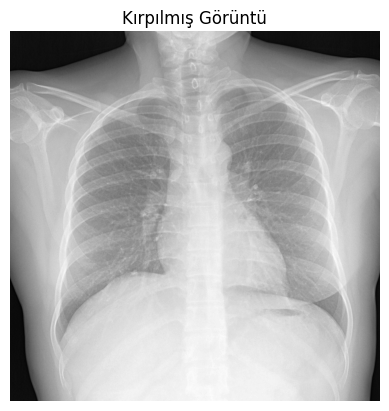

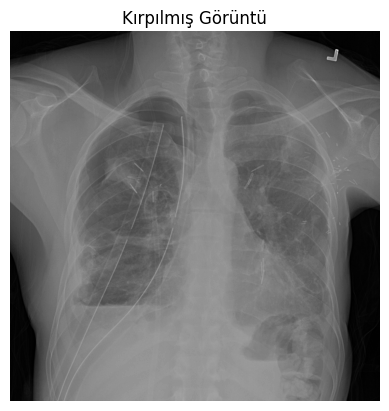

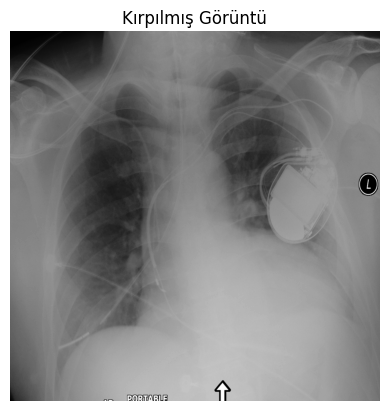

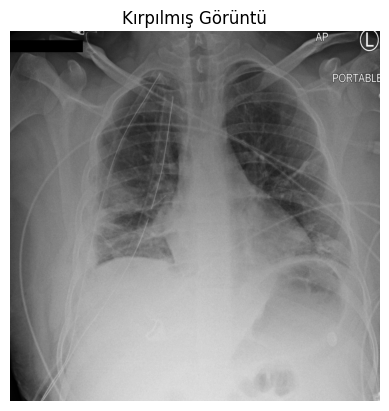

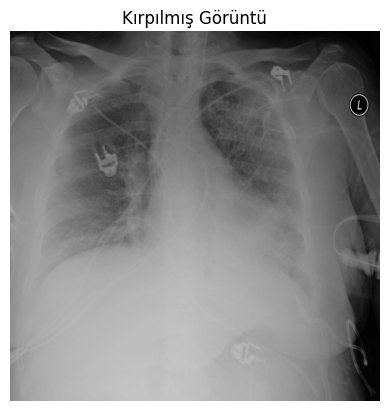

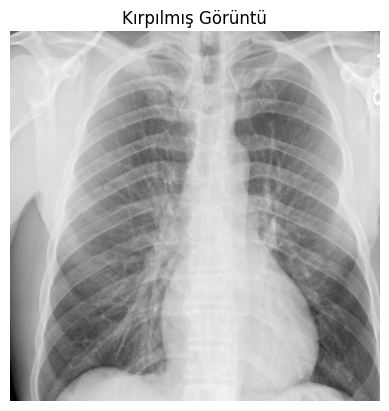

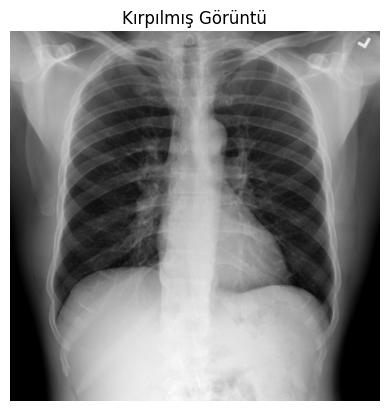

In [ ]:
# Görüntü Kırpma Fonksiyonu
def crop_image(img, top=50, bottom=50, left=50, right=50):
    return img[top:-bottom, left:-right]

# Rastgele seçilen görüntüler üzerinde kırpma işlemi
for img_name in random_images:
    img_path = os.path.join("nih/images_small", img_name)
    if not os.path.exists(img_path):
        continue

    sample_image = io.imread(img_path)
    cropped_img = crop_image(sample_image)

    plt.imshow(cropped_img, cmap='gray')
    plt.title("Kırpılmış Görüntü")
    plt.axis('off')
    plt.show()


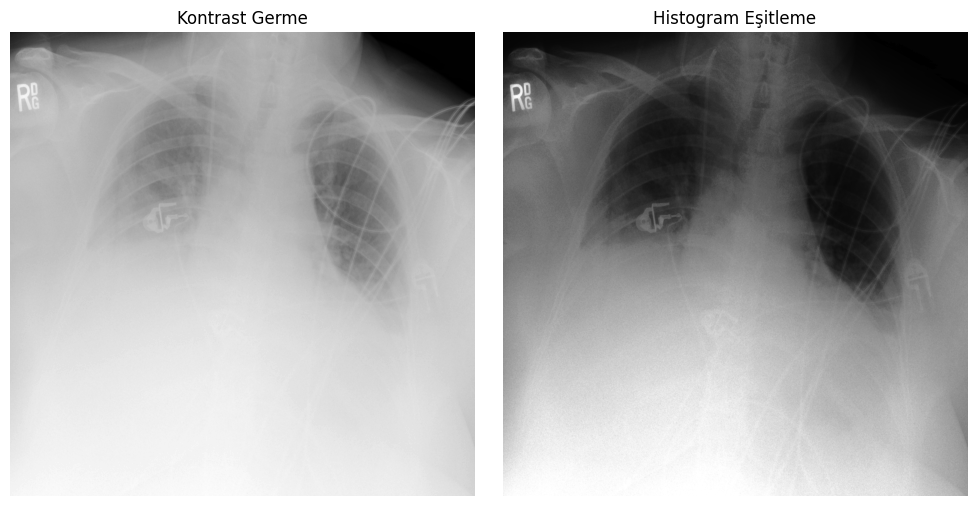

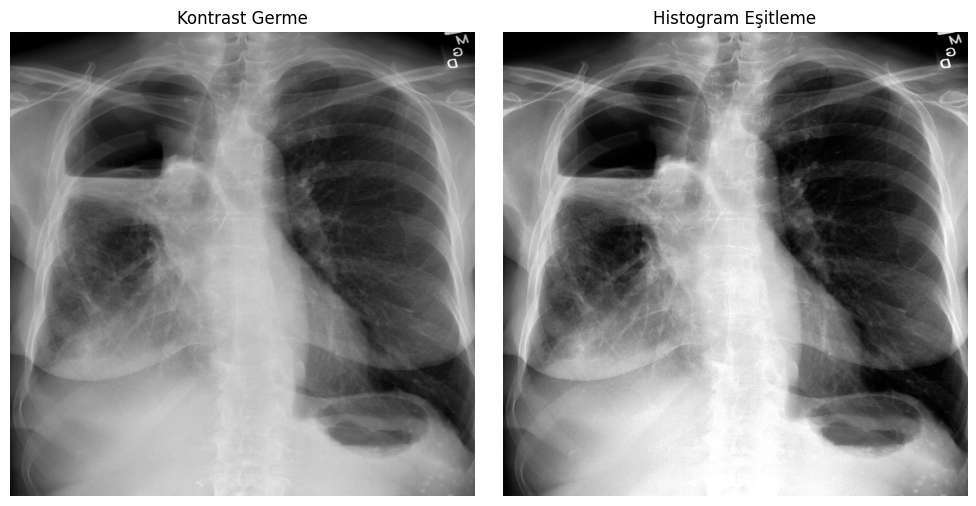

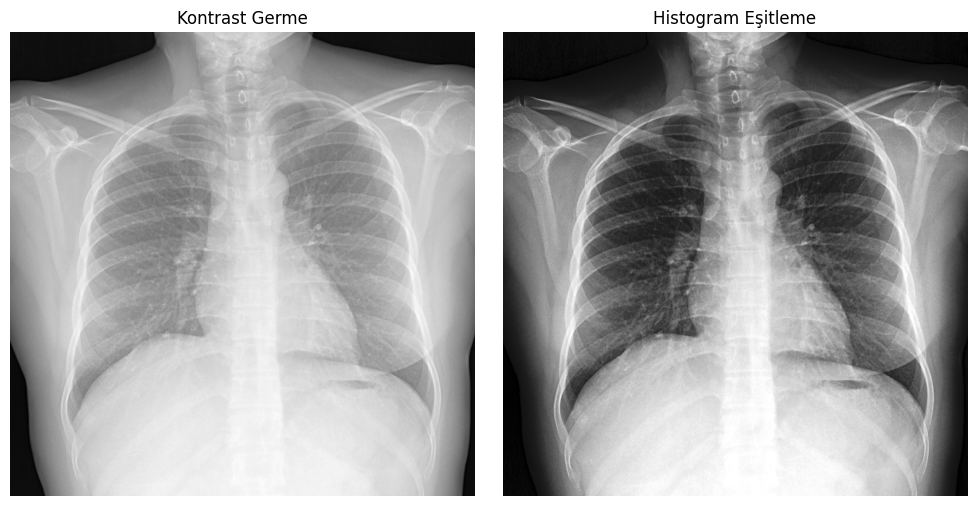

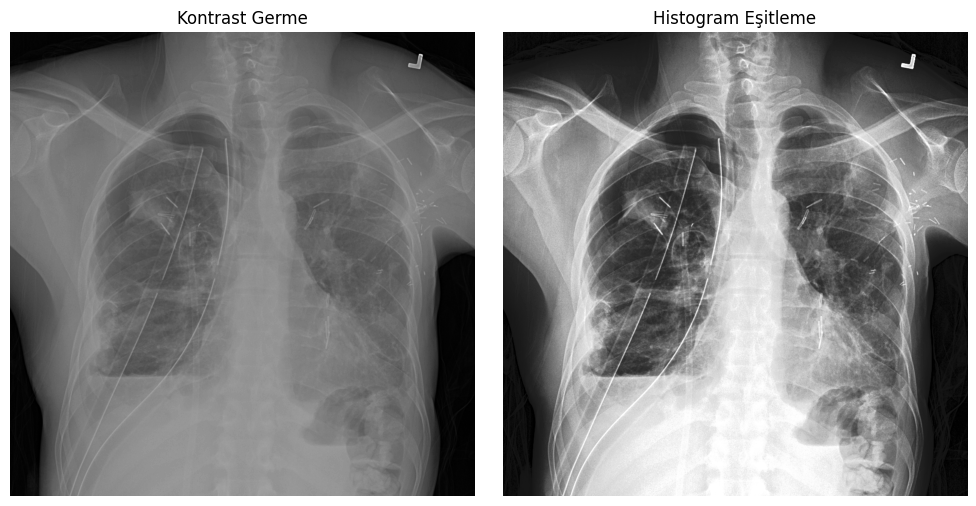

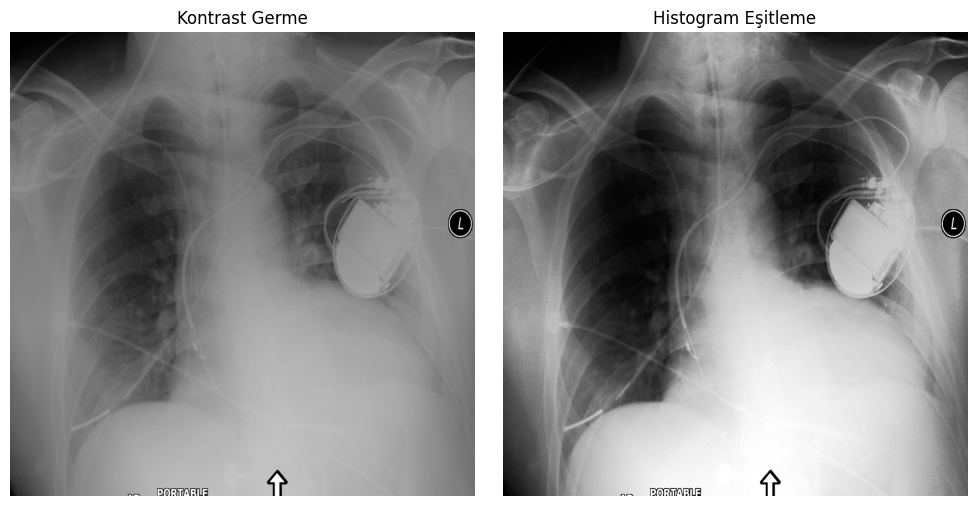

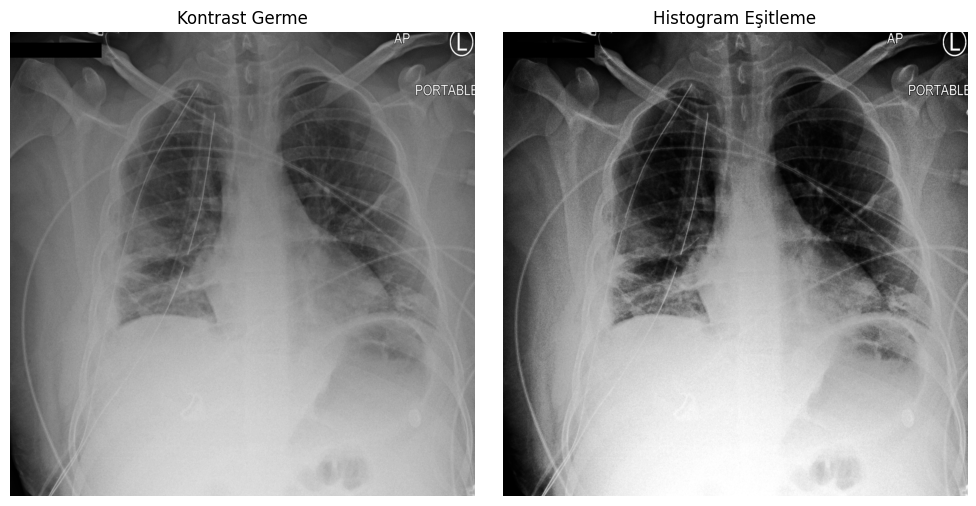

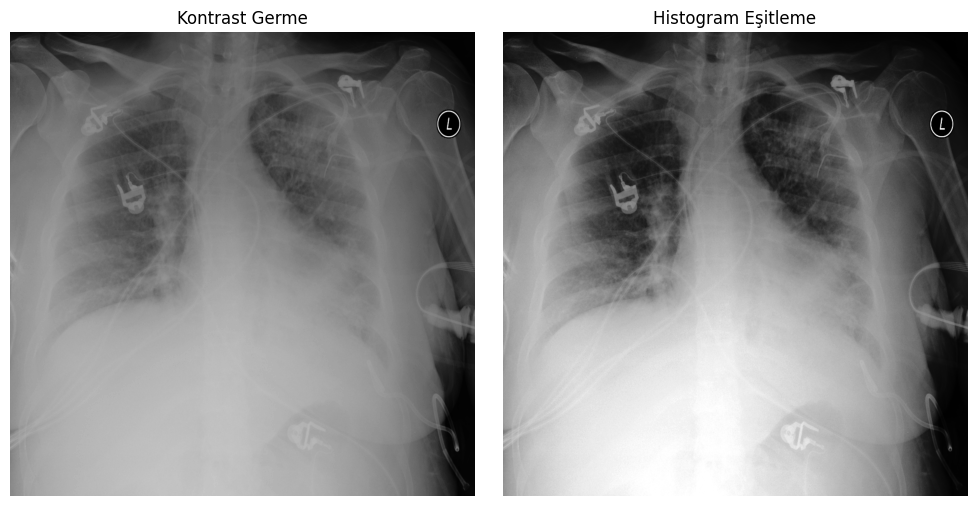

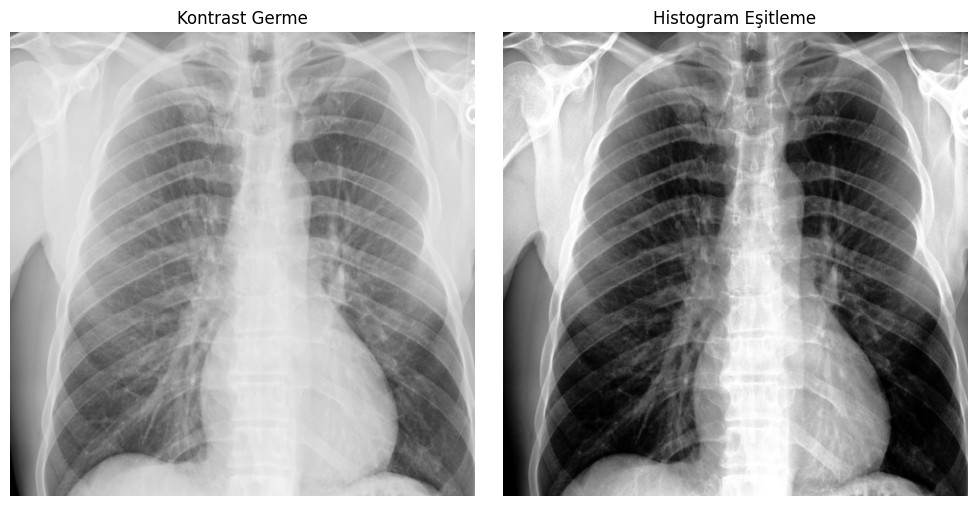

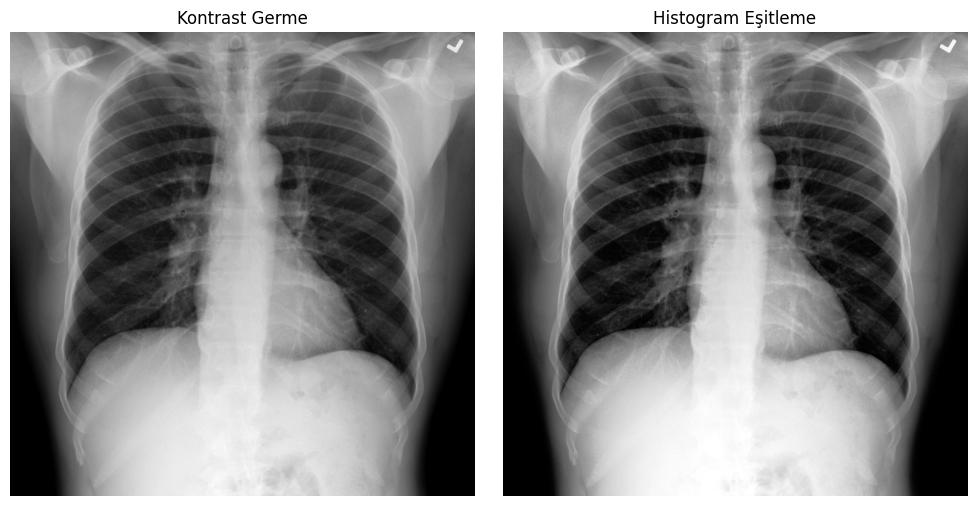

In [ ]:
# Kontrast Germe ve Histogram Eşitleme
for img_name in random_images:
    img_path = os.path.join("nih/images_small", img_name)
    if not os.path.exists(img_path):
        continue

    sample_image = io.imread(img_path)
    cropped_img = crop_image(sample_image)

    stretched_img = exposure.rescale_intensity(cropped_img)
    equalized_img = exposure.equalize_hist(cropped_img)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(stretched_img, cmap='gray')
    axes[0].set_title('Kontrast Germe')
    axes[0].axis('off')

    axes[1].imshow(equalized_img, cmap='gray')
    axes[1].set_title('Histogram Eşitleme')
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()

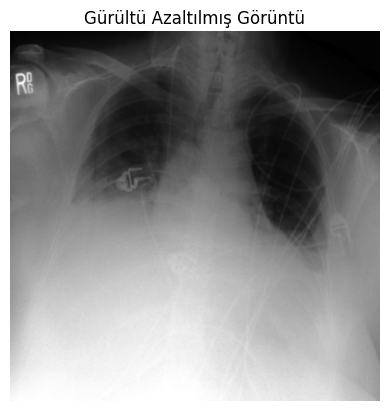

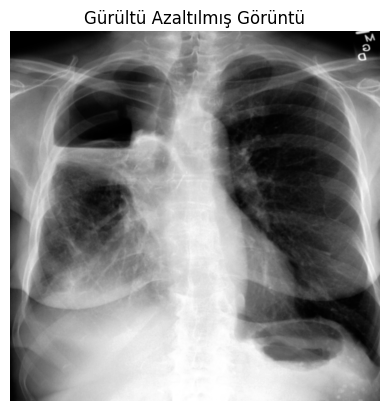

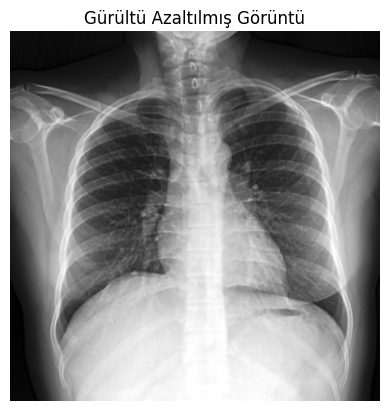

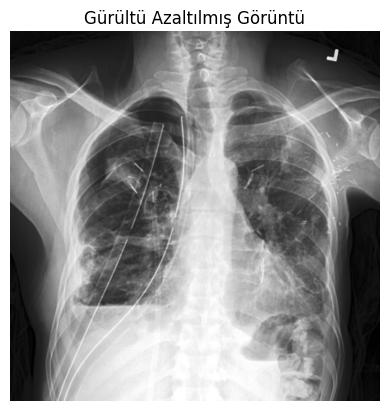

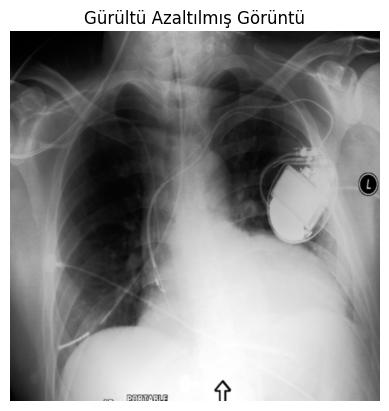

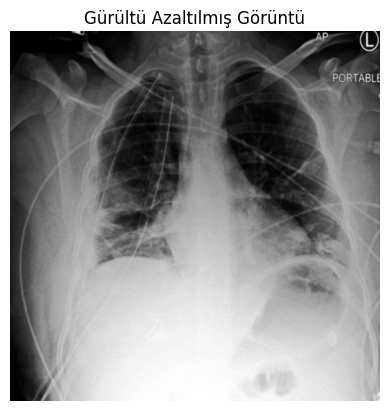

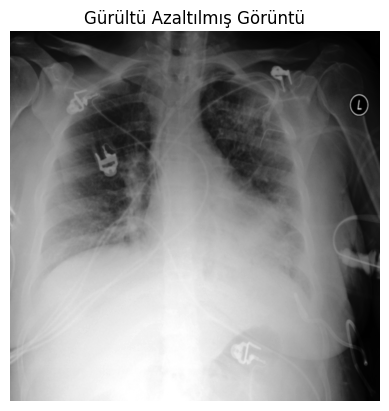

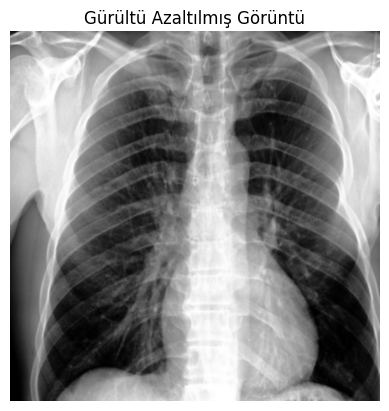

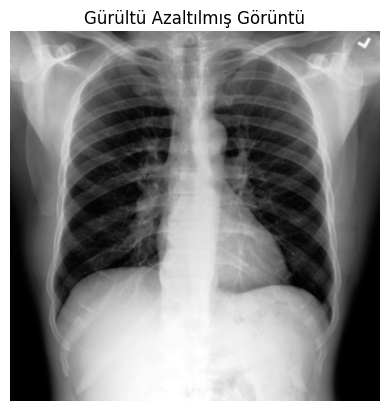

In [ ]:
# Gürültü Azaltma (Gaussian Blur)
for img_name in random_images:
    img_path = os.path.join("nih/images_small", img_name)
    if not os.path.exists(img_path):
        continue

    sample_image = io.imread(img_path)
    cropped_img = crop_image(sample_image)
    equalized_img = exposure.equalize_hist(cropped_img)

    denoised_img = cv2.GaussianBlur(equalized_img, (5, 5), 0)

    plt.imshow(denoised_img, cmap='gray')
    plt.title("Gürültü Azaltılmış Görüntü")
    plt.axis('off')
    plt.show()

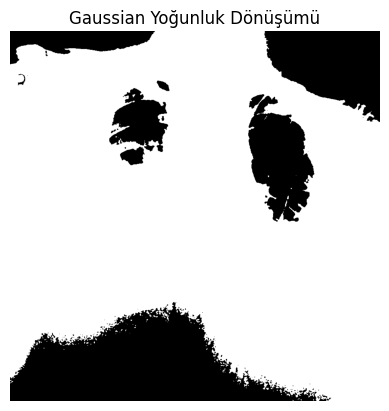

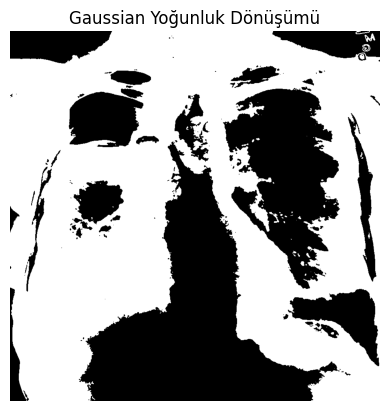

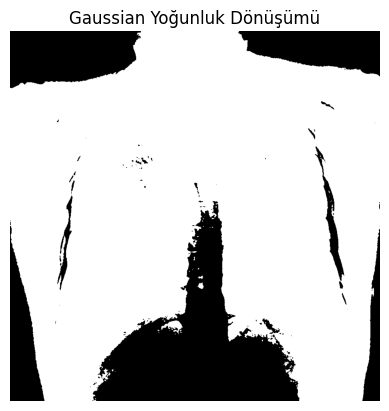

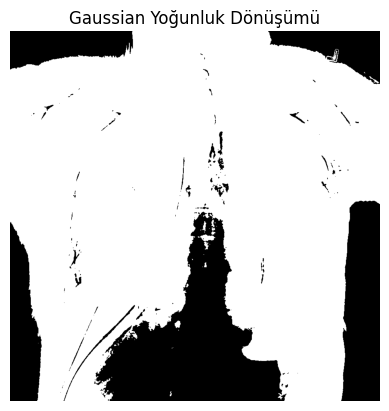

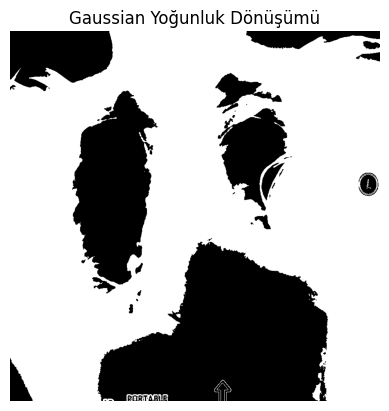

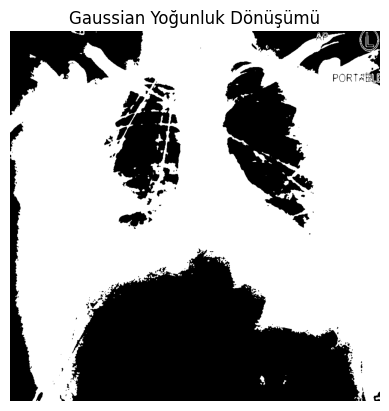

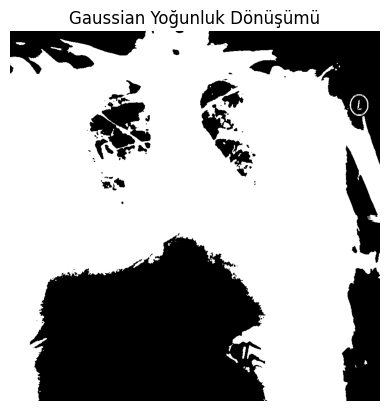

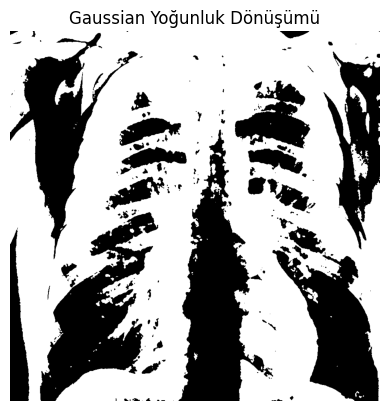

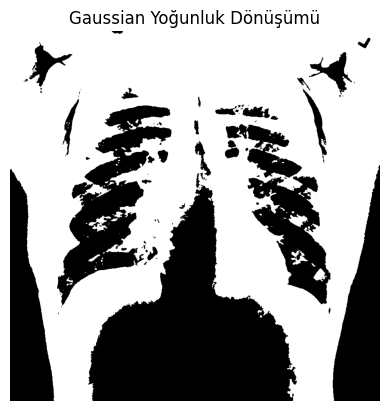

In [ ]:
# Gaussian Yoğunluk Dönüşümü
def gaussian_intensity_transform(image, mean, std):
    low = mean - std
    high = mean + std
    transformed_image = np.where((image >= low) & (image <= high), 1, 0)
    return transformed_image

for img_name in random_images:
    img_path = os.path.join("nih/images_small", img_name)
    if not os.path.exists(img_path):
        continue

    sample_image = io.imread(img_path)
    cropped_img = crop_image(sample_image)
    denoised_img = cv2.GaussianBlur(cropped_img, (5, 5), 0)

    mean_intensity = np.mean(denoised_img)
    std_intensity = np.std(denoised_img)
    transformed_image = gaussian_intensity_transform(denoised_img, mean_intensity, std_intensity)

    plt.imshow(transformed_image, cmap='gray')
    plt.title("Gaussian Yoğunluk Dönüşümü")
    plt.axis('off')
    plt.show()


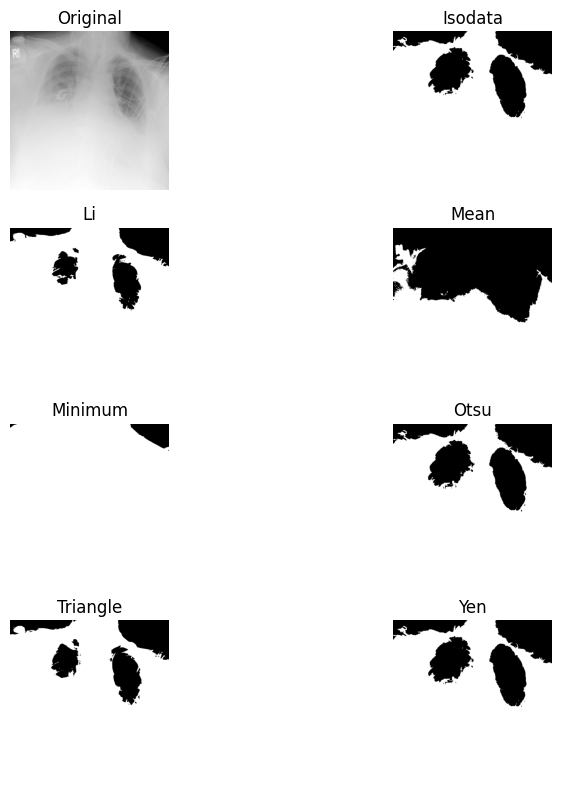

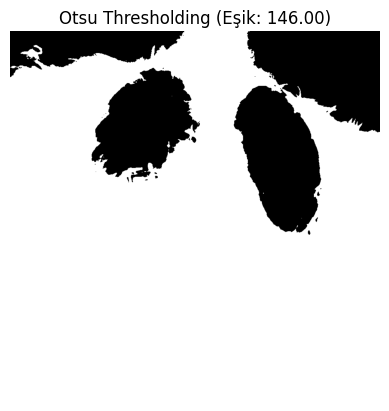

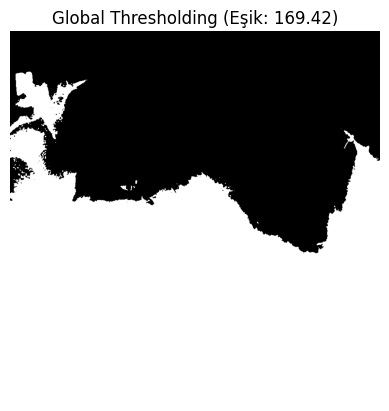

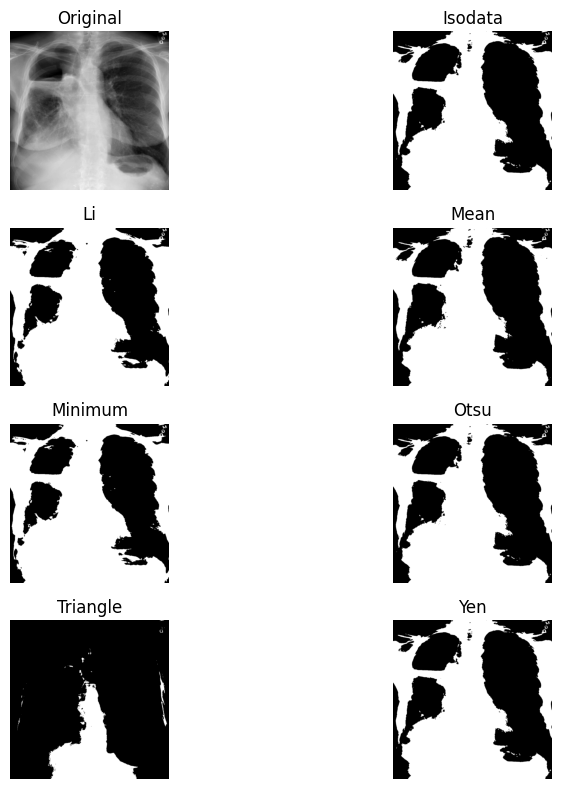

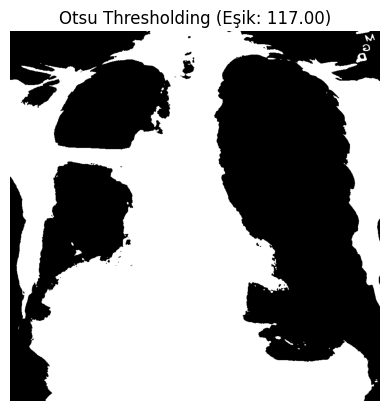

...

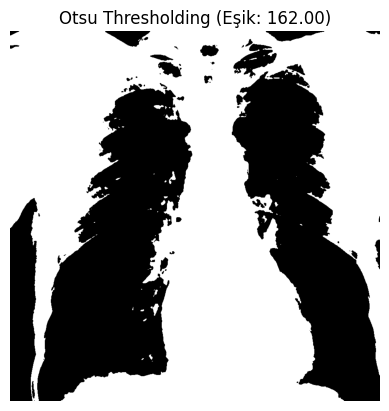

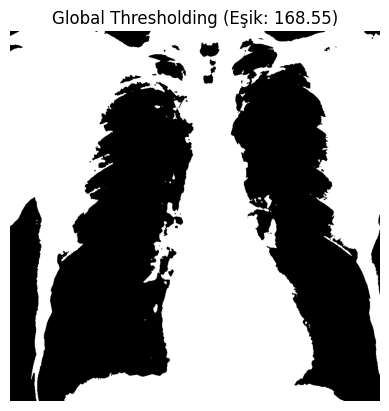

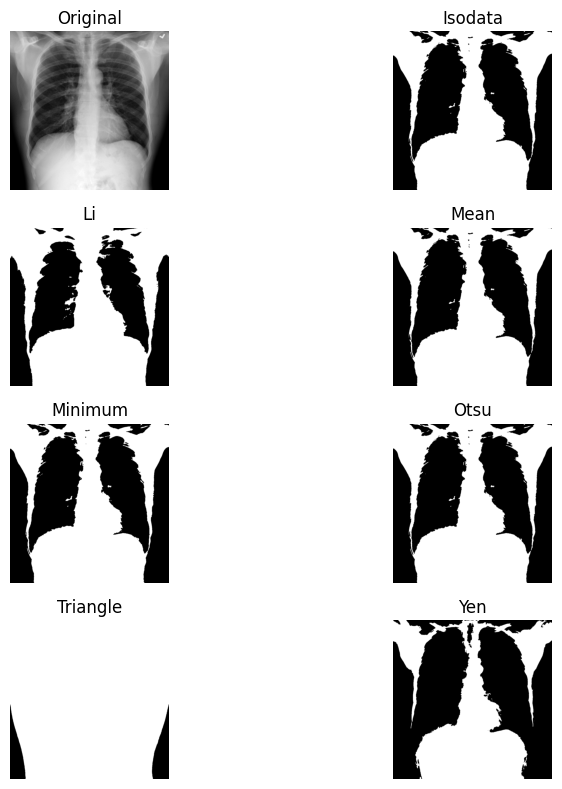

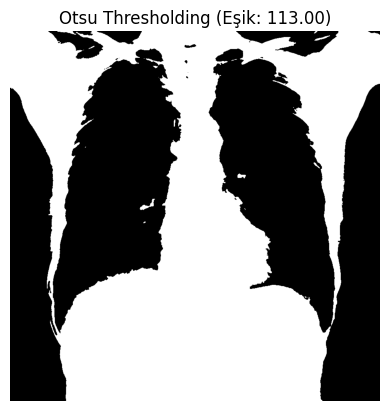

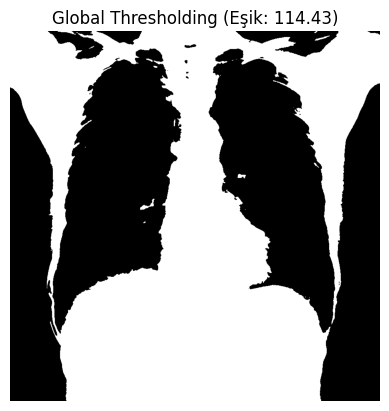

In [ ]:
from skimage.filters import try_all_threshold, threshold_otsu

# try_all_threshold ile farklı thresholding yöntemlerini karşılaştırma
for img_name in random_images:
    img_path = os.path.join("nih/images_small", img_name)
    if not os.path.exists(img_path):
        print(f"Dosya bulunamadı, atlanıyor: {img_path}")
        continue

    # Görüntüyü yükle ve ön işleme uygula
    sample_image = io.imread(img_path)
    cropped_img = crop_image(sample_image)
    denoised_img = cv2.GaussianBlur(cropped_img, (5, 5), 0)

    # 1. try_all_threshold: Farklı thresholding yöntemlerini dener
    fig, ax = try_all_threshold(denoised_img, figsize=(10, 8), verbose=False)
    plt.show()

    # 2. Otsu Thresholding
    otsu_thresh = threshold_otsu(denoised_img)
    binary_otsu = denoised_img > otsu_thresh

    plt.imshow(binary_otsu, cmap='gray')
    plt.title(f"Otsu Thresholding (Eşik: {otsu_thresh:.2f})")
    plt.axis('off')
    plt.show()

    # 3. Global Thresholding (Dinamik Eşik Değeri)
    global_thresh = np.mean(denoised_img)  # Dinamik eşik olarak ortalama yoğunluk
    binary_global = denoised_img > global_thresh

    plt.imshow(binary_global, cmap='gray')
    plt.title(f"Global Thresholding (Eşik: {global_thresh:.2f})")
    plt.axis('off')
    plt.show()



Farklı thresholding yöntemlerini deneme (00009920_004.png):


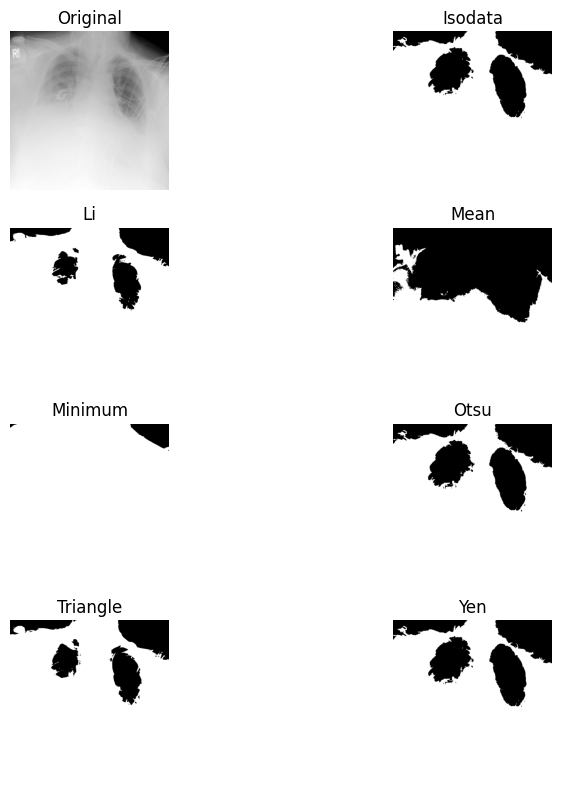

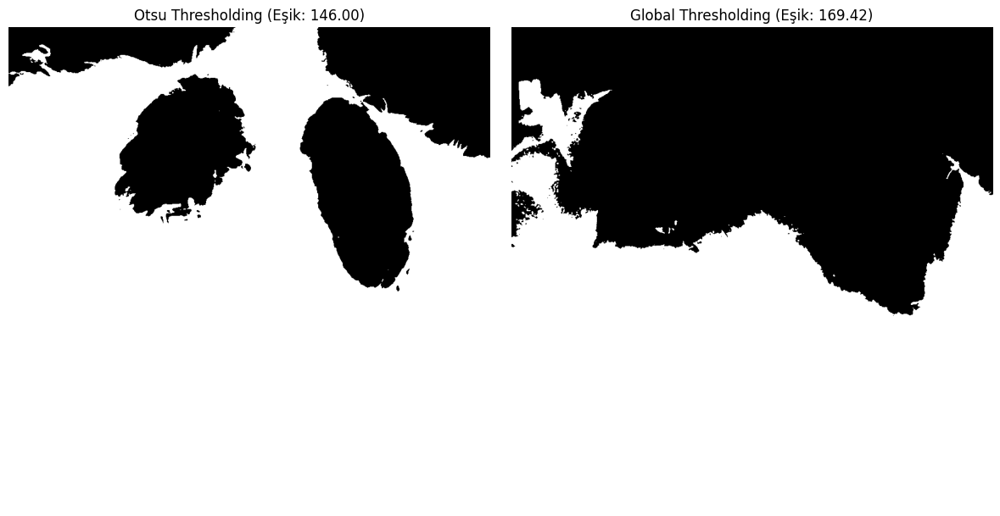


Çoklu eşik segmentasyonu uygulanıyor:


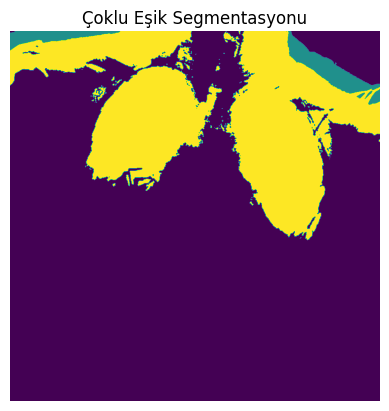


Farklı thresholding yöntemlerini deneme (00013209_020.png):


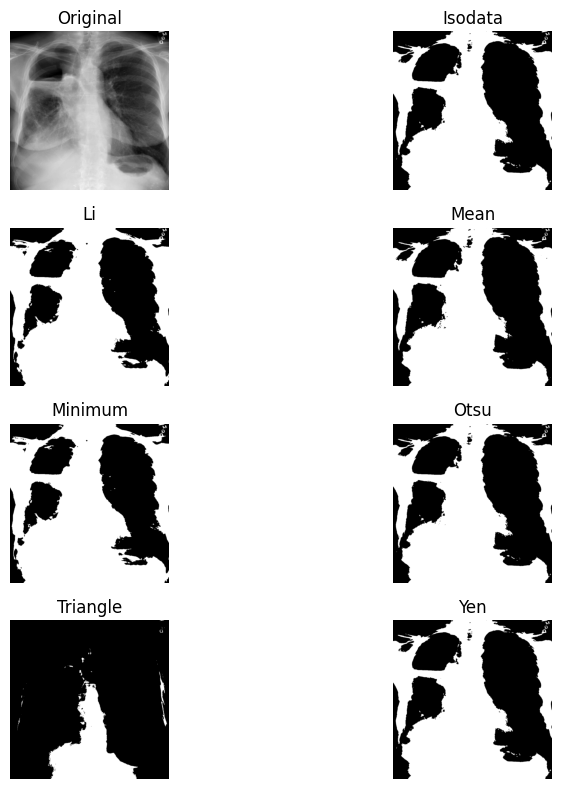

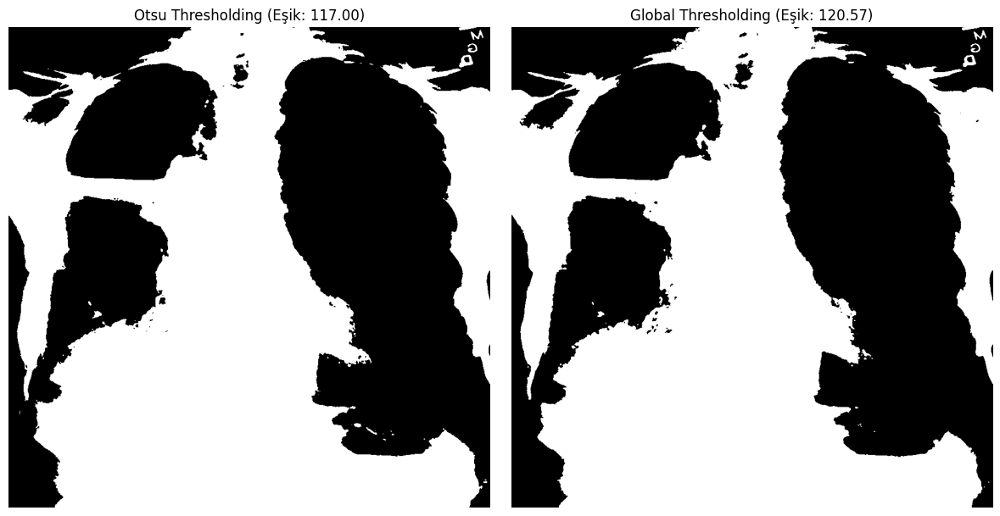


Çoklu eşik segmentasyonu uygulanıyor:


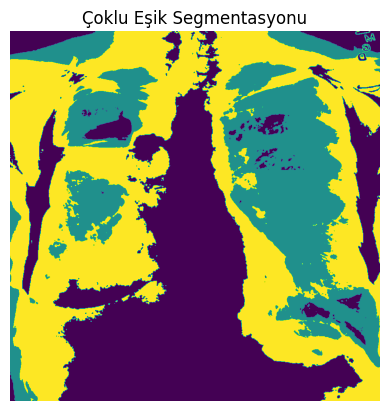


Farklı thresholding yöntemlerini deneme (00029593_000.png):


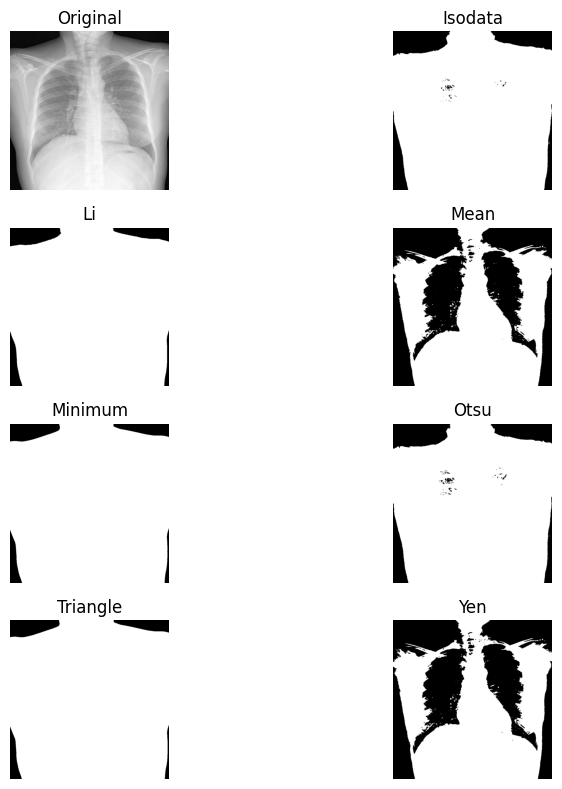

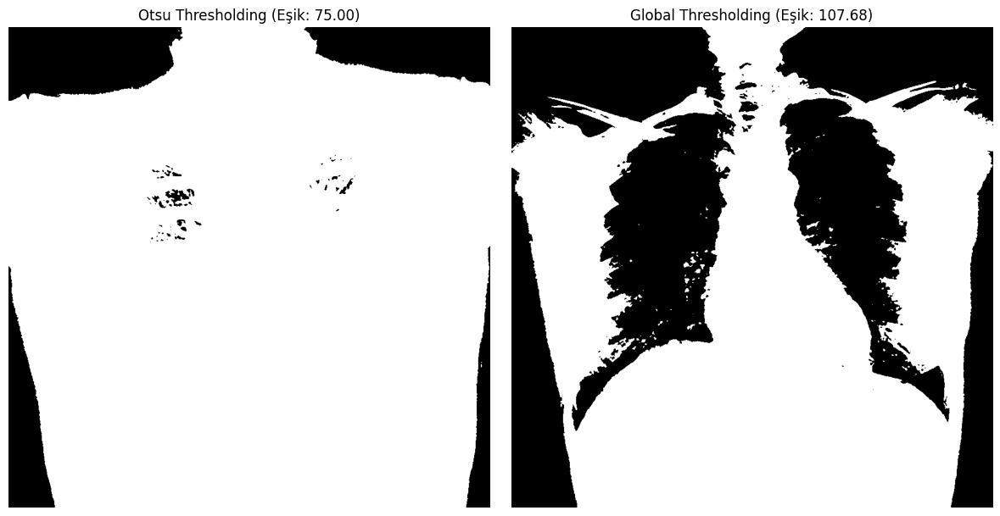


Çoklu eşik segmentasyonu uygulanıyor:


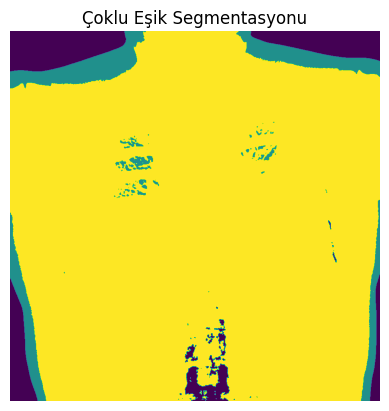


Farklı thresholding yöntemlerini deneme (00028876_048.png):


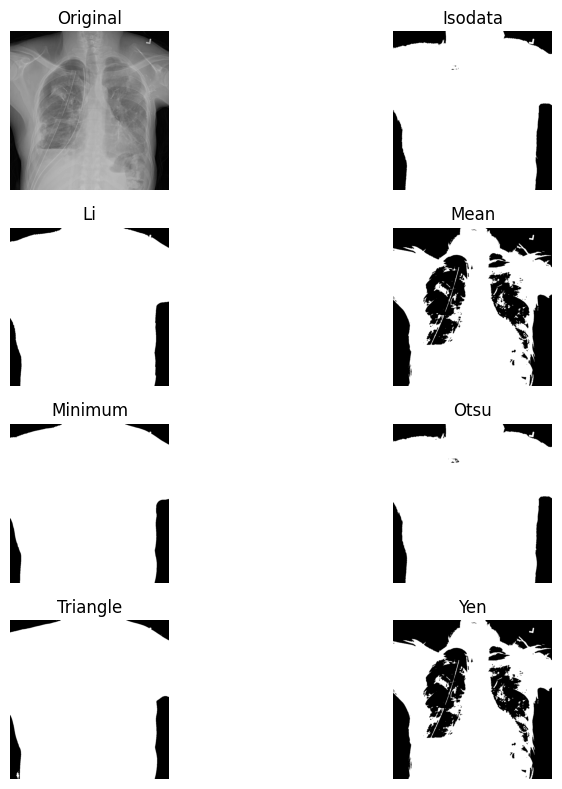

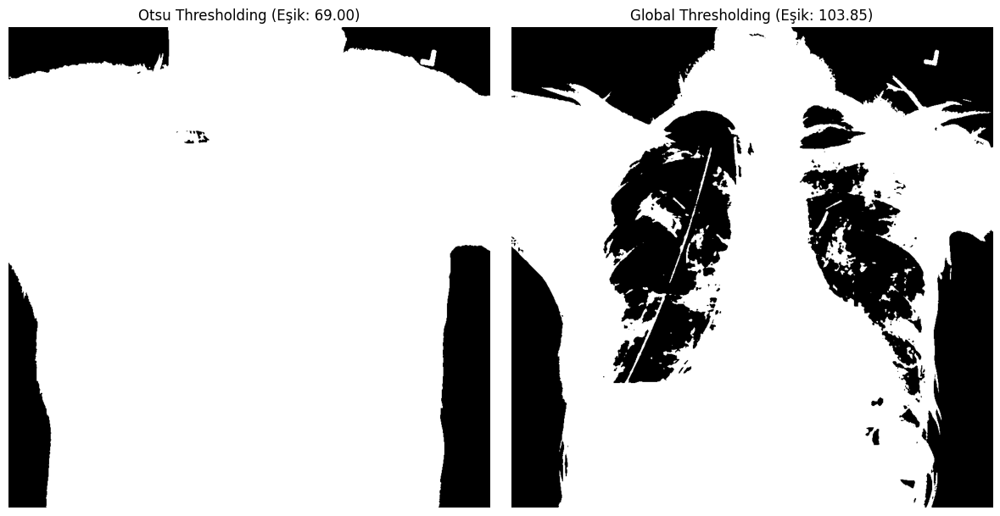


Çoklu eşik segmentasyonu uygulanıyor:


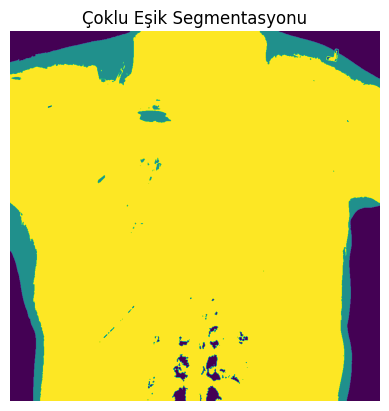


Farklı thresholding yöntemlerini deneme (00016034_001.png):


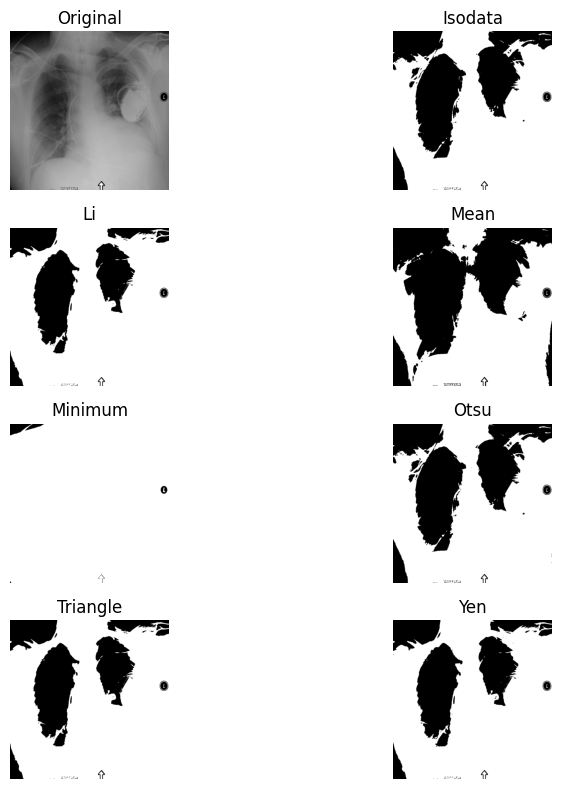

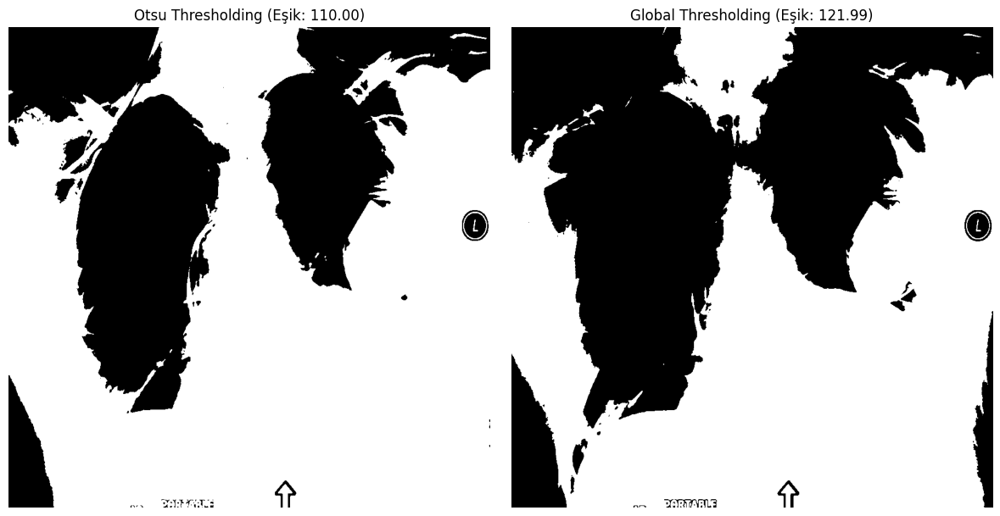


Çoklu eşik segmentasyonu uygulanıyor:


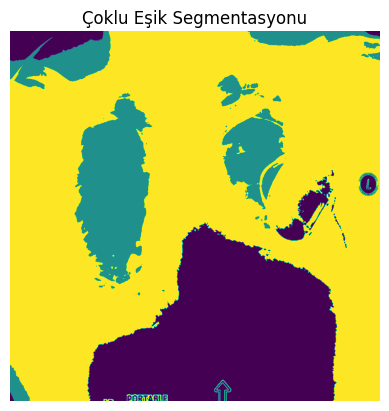


Farklı thresholding yöntemlerini deneme (00004523_003.png):


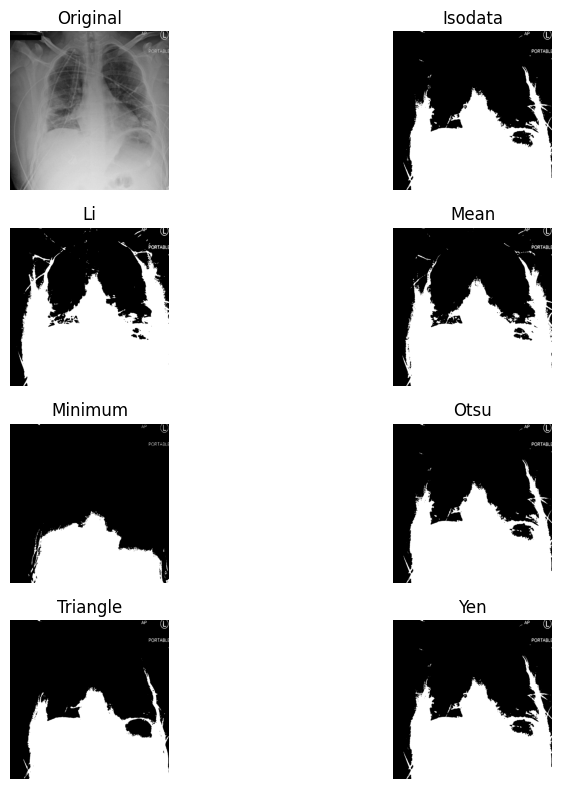

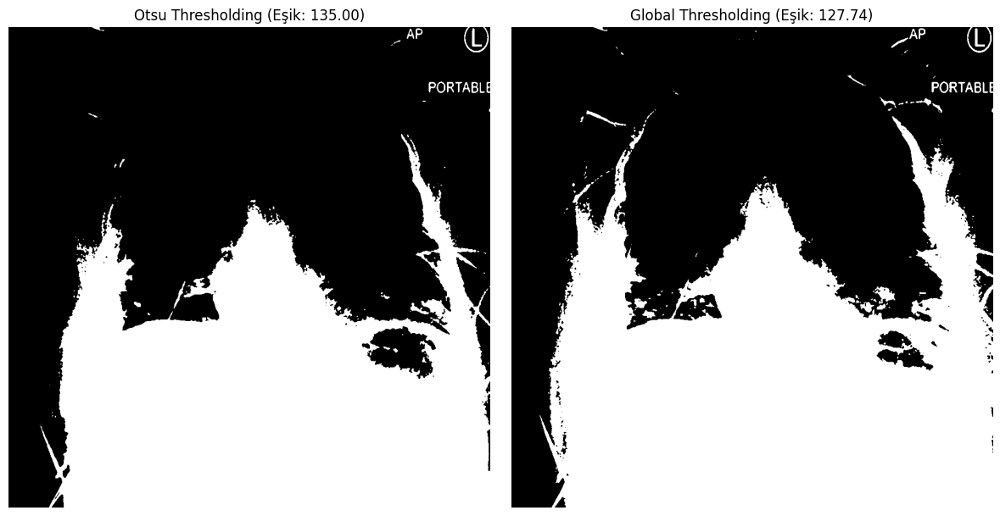


Çoklu eşik segmentasyonu uygulanıyor:


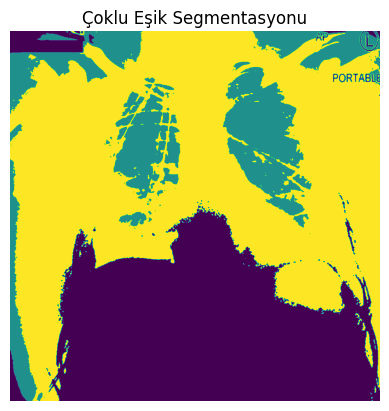


Farklı thresholding yöntemlerini deneme (00013003_027.png):


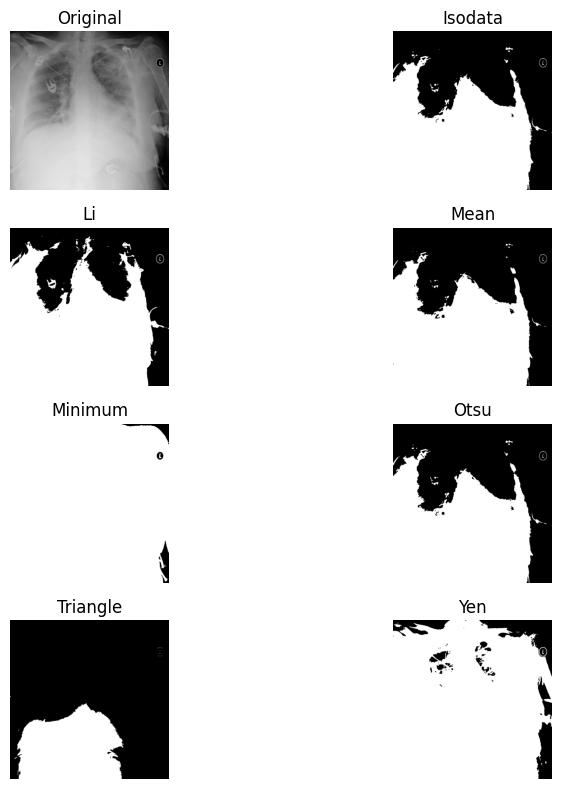

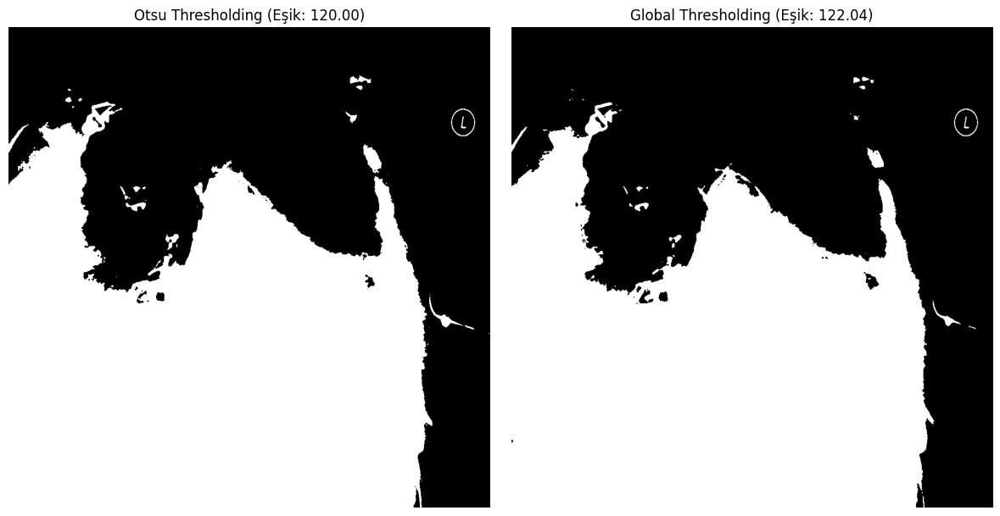


Çoklu eşik segmentasyonu uygulanıyor:


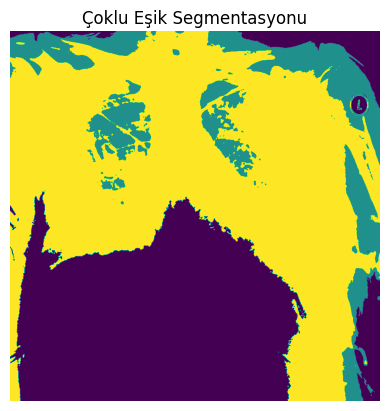


Farklı thresholding yöntemlerini deneme (00000918_000.png):


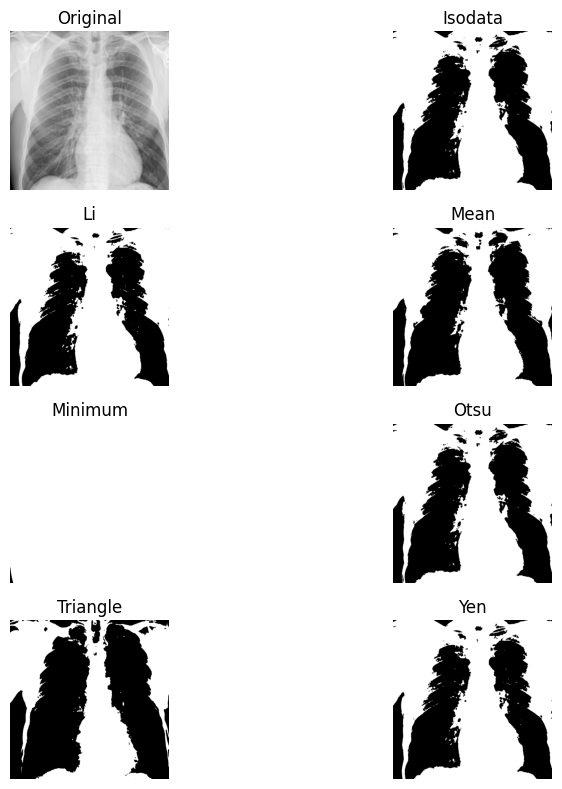

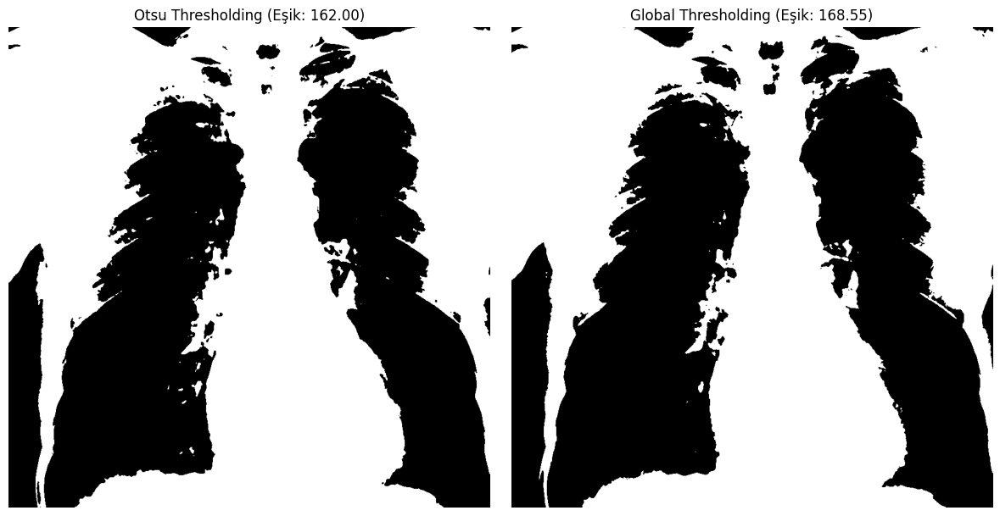


Çoklu eşik segmentasyonu uygulanıyor:


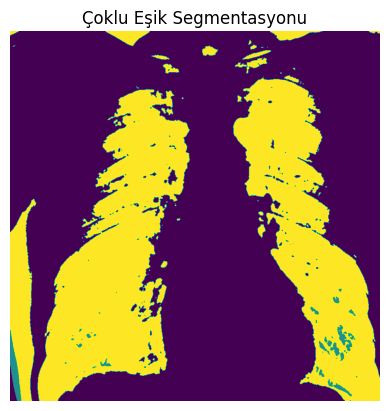


Farklı thresholding yöntemlerini deneme (00026500_000.png):


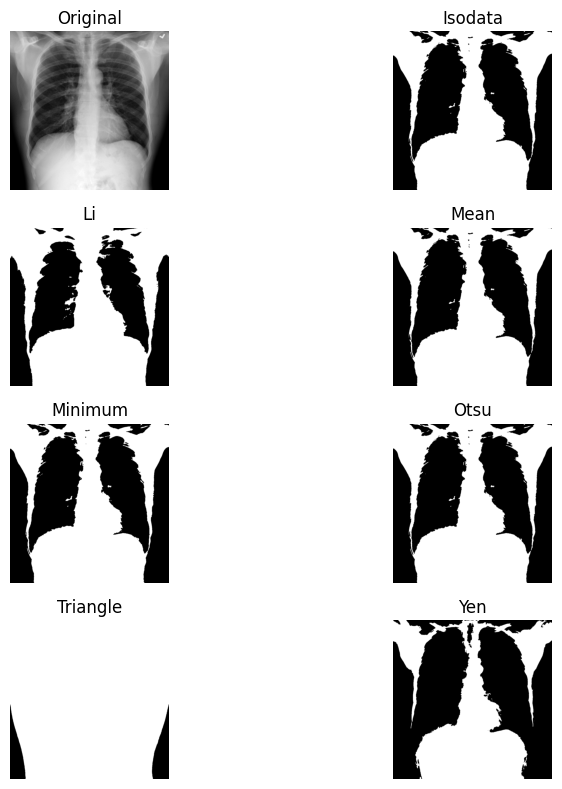

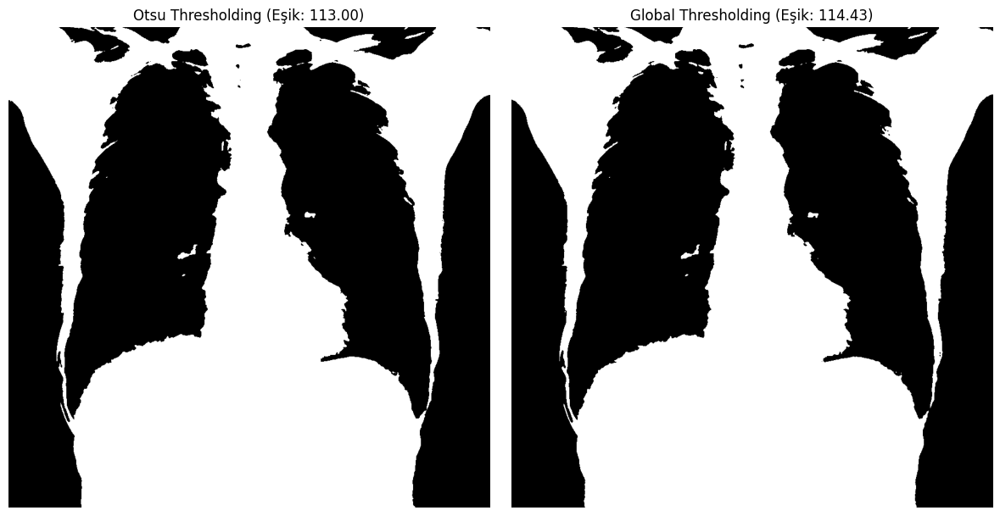


Çoklu eşik segmentasyonu uygulanıyor:


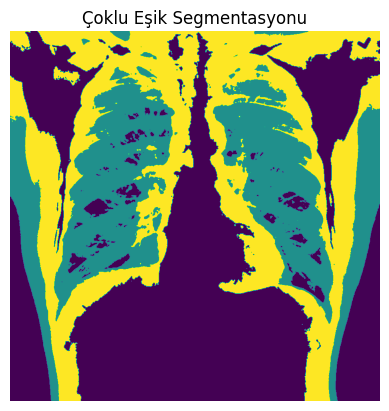

In [ ]:
def multi_threshold_segmentation(image, thresholds):
    result = np.zeros_like(image, dtype=np.uint8)
    thresholds = sorted(thresholds)  # Eşik değerlerini sırala
    for i, thresh in enumerate(thresholds):
        if i == 0:
            result[image <= thresh] = i
        elif i == len(thresholds):
            result[image > thresh] = i
        else:
            result[(image > thresholds[i - 1]) & (image <= thresh)] = i
    return result



# Farklı eşikleme yöntemlerini karşılaştır
for img_name in random_images:
    img_path = os.path.join("nih/images_small", img_name)
    if not os.path.exists(img_path):
        continue

    sample_image = io.imread(img_path)
    cropped_img = crop_image(sample_image)
    denoised_img = cv2.GaussianBlur(cropped_img, (5, 5), 0)

    # 1. try_all_threshold: Farklı eşikleme yöntemlerini analiz et
    print(f"\nFarklı thresholding yöntemlerini deneme ({img_name}):")
    fig, ax = try_all_threshold(denoised_img, figsize=(10, 8), verbose=False)
    plt.show()

    # 2. Otsu ve Global Thresholding
    otsu_thresh = threshold_otsu(denoised_img)
    binary_otsu = denoised_img > otsu_thresh
    global_thresh = np.mean(denoised_img)  # Ortalama yoğunluk
    binary_global = denoised_img > global_thresh

    # Otsu ve Global Thresholding sonuçlarını görselleştir
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(binary_otsu, cmap='gray')
    axes[0].set_title(f"Otsu Thresholding (Eşik: {otsu_thresh:.2f})")
    axes[1].imshow(binary_global, cmap='gray')
    axes[1].set_title(f"Global Thresholding (Eşik: {global_thresh:.2f})")
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

    # 3. Çoklu Eşik Segmentasyonu
    print("\nÇoklu eşik segmentasyonu uygulanıyor:")
    thresholds = [0.1, 0.3, 0.6]  # Histogram analizine dayalı
    normalized_img = denoised_img / 255.0  # Normalize etme
    segmented_image = multi_threshold_segmentation(normalized_img, thresholds)

    # Çoklu eşik segmentasyonu görselleştir
    plt.imshow(segmented_image, cmap='viridis')
    plt.title("Çoklu Eşik Segmentasyonu")
    plt.axis('off')
    plt.show()


Toplam Bölge Sayısı: 3
Bölge 1: Alan=688511.0, Centroid=(529.1877195861795, 437.9522636530135), Eksen Oranı=0.8064304923071157
Bölge 2: Alan=81.0, Centroid=(162.0, 404.0), Eksen Oranı=0.6694214876033058
Bölge 3: Alan=81.0, Centroid=(467.0, 728.0), Eksen Oranı=0.6694214876033058


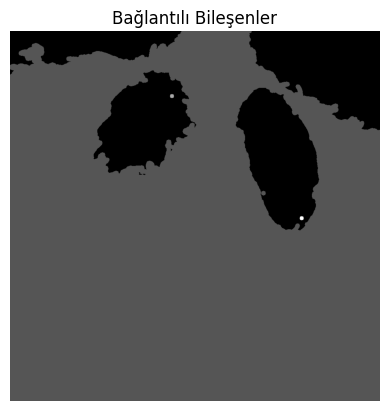

Toplam Bölge Sayısı: 9
Bölge 1: Alan=445294.0, Centroid=(544.0211186317355, 374.36401343831267), Eksen Oranı=0.5221234164896137
Bölge 2: Alan=51100.0, Centroid=(297.28060665362034, 869.6051663405088), Eksen Oranı=0.3418700492399914
Bölge 3: Alan=165.0, Centroid=(72.33333333333333, 695.4606060606061), Eksen Oranı=0.7051282051282052
Bölge 4: Alan=211.0, Centroid=(531.5308056872038, 155.40758293838863), Eksen Oranı=0.7326388888888888
Bölge 5: Alan=478.0, Centroid=(553.0251046025105, 169.09623430962344), Eksen Oranı=0.6828571428571428
Bölge 6: Alan=148.0, Centroid=(740.972972972973, 21.35810810810811), Eksen Oranı=0.7254901960784313
Bölge 7: Alan=806.0, Centroid=(771.5012406947891, 683.0694789081886), Eksen Oranı=0.4269067796610169
Bölge 8: Alan=210.0, Centroid=(780.7333333333333, 735.5), Eksen Oranı=0.6501547987616099
Bölge 9: Alan=241.0, Centroid=(788.7759336099585, 719.850622406639), Eksen Oranı=0.654891304347826


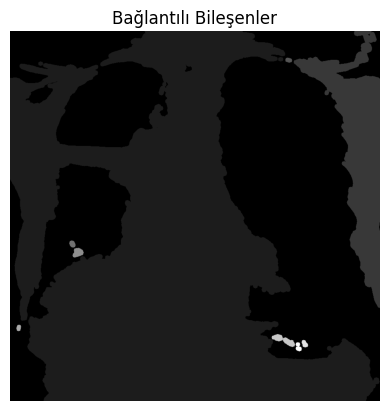

Toplam Bölge Sayısı: 1
Bölge 1: Alan=762570.0, Centroid=(484.86315748062475, 471.3729270755472), Eksen Oranı=0.8931733850565019


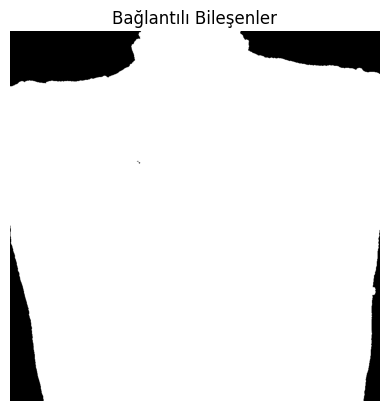

Toplam Bölge Sayısı: 1
Bölge 1: Alan=746979.0, Centroid=(462.9032944701257, 453.20657207230727), Eksen Oranı=0.8749121549446225


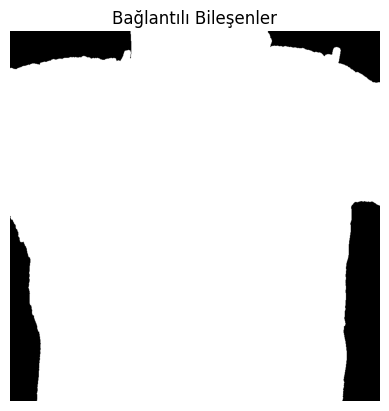

Toplam Bölge Sayısı: 12
Bölge 1: Alan=602416.0, Centroid=(527.8226026533159, 500.7871719874638), Eksen Oranı=0.7055902250707445
Bölge 2: Alan=1131.0, Centroid=(18.883289124668433, 879.8337754199823), Eksen Oranı=0.6426136363636363
Bölge 3: Alan=92.0, Centroid=(45.0, 849.5), Eksen Oranı=0.696969696969697
Bölge 4: Alan=580.0, Centroid=(50.53448275862069, 898.7586206896551), Eksen Oranı=0.7416879795396419
Bölge 5: Alan=279.0, Centroid=(62.587813620071685, 636.3440860215054), Eksen Oranı=0.5647773279352226
Bölge 6: Alan=192.0, Centroid=(126.015625, 5.296875), Eksen Oranı=0.7619047619047619
Bölge 7: Alan=140.0, Centroid=(136.55, 106.44285714285714), Eksen Oranı=0.625
Bölge 8: Alan=124.0, Centroid=(276.35483870967744, 383.61290322580646), Eksen Oranı=0.7380952380952381
Bölge 9: Alan=448.0, Centroid=(383.9330357142857, 894.2388392857143), Eksen Oranı=0.6787878787878788
Bölge 10: Alan=244.0, Centroid=(439.1803278688525, 591.2172131147541), Eksen Oranı=0.6777777777777778
Bölge 11: Alan=189.0, C

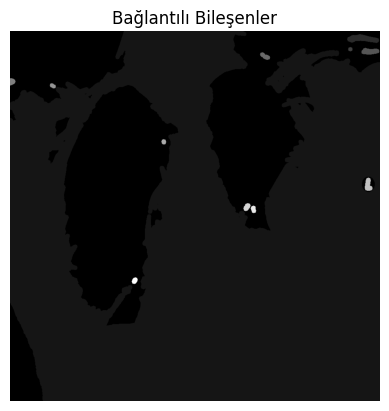

Toplam Bölge Sayısı: 17
Bölge 1: Alan=376.0, Centroid=(4.997340425531915, 172.4654255319149), Eksen Oranı=0.6886446886446886
Bölge 2: Alan=901.0, Centroid=(13.573806881243064, 778.2486126526082), Eksen Oranı=0.7767241379310345
Bölge 3: Alan=2209.0, Centroid=(26.514712539610684, 895.5156179266636), Eksen Oranı=0.7302479338842975
Bölge 4: Alan=310.0, Centroid=(31.025806451612905, 742.5709677419355), Eksen Oranı=0.5535714285714286
Bölge 5: Alan=3441.0, Centroid=(116.54606219122348, 862.8793955245568), Eksen Oranı=0.8742378048780488
Bölge 6: Alan=148.0, Centroid=(143.40540540540542, 796.6486486486486), Eksen Oranı=0.7708333333333334
Bölge 7: Alan=97.0, Centroid=(160.7835051546392, 920.360824742268), Eksen Oranı=0.7132352941176471
Bölge 8: Alan=379.0, Centroid=(171.98944591029024, 164.56728232189974), Eksen Oranı=0.4922077922077922
Bölge 9: Alan=377921.0, Centroid=(684.1731949269821, 504.37953434712546), Eksen Oranı=0.6023432544173103
Bölge 10: Alan=477.0, Centroid=(263.7505241090147, 212.5

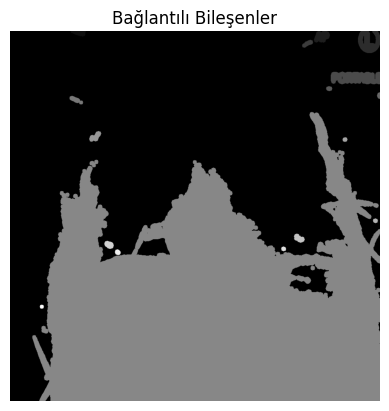

Toplam Bölge Sayısı: 15
Bölge 1: Alan=1198.0, Centroid=(105.8923205342237, 673.3063439065108), Eksen Oranı=0.6305263157894737
Bölge 2: Alan=167.0, Centroid=(121.62275449101796, 116.35928143712574), Eksen Oranı=0.7455357142857143
Bölge 3: Alan=465.0, Centroid=(144.952688172043, 117.27741935483871), Eksen Oranı=0.5555555555555556
Bölge 4: Alan=202.0, Centroid=(140.5891089108911, 137.0990099009901), Eksen Oranı=0.7426470588235294
Bölge 5: Alan=461601.0, Centroid=(626.0759660399349, 386.93445421478725), Eksen Oranı=0.6556534362074451
Bölge 6: Alan=1774.0, Centroid=(184.2446448703495, 871.5), Eksen Oranı=0.5028344671201814
Bölge 7: Alan=601.0, Centroid=(173.76372712146423, 657.3610648918469), Eksen Oranı=0.5691287878787878
Bölge 8: Alan=436.0, Centroid=(185.9059633027523, 871.3967889908257), Eksen Oranı=0.6606060606060606
Bölge 9: Alan=999.0, Centroid=(210.73873873873873, 16.86186186186186), Eksen Oranı=0.3547585227272727
Bölge 10: Alan=81.0, Centroid=(274.0, 368.0), Eksen Oranı=0.669421487

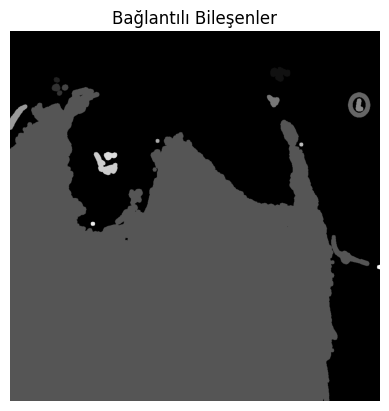

Toplam Bölge Sayısı: 18
Bölge 1: Alan=545276.0, Centroid=(416.2116506136342, 469.28159317483255), Eksen Oranı=0.6386640055471224
Bölge 2: Alan=243.0, Centroid=(218.7037037037037, 266.74074074074076), Eksen Oranı=0.6942857142857143
Bölge 3: Alan=834.0, Centroid=(367.8525179856115, 401.9412470023981), Eksen Oranı=0.5225563909774437
Bölge 4: Alan=112.0, Centroid=(356.625, 359.14285714285717), Eksen Oranı=0.717948717948718
Bölge 5: Alan=81.0, Centroid=(363.0, 715.0), Eksen Oranı=0.6694214876033058
Bölge 6: Alan=241.0, Centroid=(368.57676348547716, 269.3029045643153), Eksen Oranı=0.6846590909090909
Bölge 7: Alan=81.0, Centroid=(370.0, 667.0), Eksen Oranı=0.6694214876033058
Bölge 8: Alan=198.0, Centroid=(444.6868686868687, 348.7828282828283), Eksen Oranı=0.7071428571428572
Bölge 9: Alan=112.0, Centroid=(450.85714285714283, 368.375), Eksen Oranı=0.717948717948718
Bölge 10: Alan=120.0, Centroid=(477.5, 210.5), Eksen Oranı=0.7142857142857143
Bölge 11: Alan=161.0, Centroid=(483.3229813664596, 72

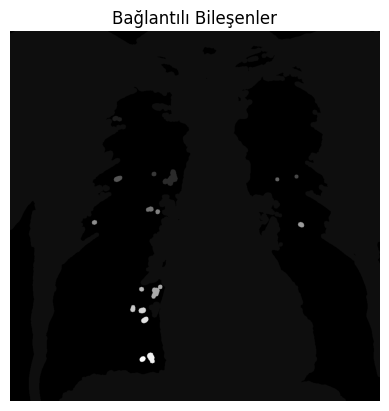

Toplam Bölge Sayısı: 7
Bölge 1: Alan=468534.0, Centroid=(474.6201236196306, 462.2332253369019), Eksen Oranı=0.548778602350031
Bölge 2: Alan=150.0, Centroid=(4.18, 762.2), Eksen Oranı=0.7177033492822966
Bölge 3: Alan=276.0, Centroid=(40.51086956521739, 203.2536231884058), Eksen Oranı=0.6133333333333333
Bölge 4: Alan=108.0, Centroid=(289.5, 188.0), Eksen Oranı=0.6923076923076923
Bölge 5: Alan=517.0, Centroid=(361.9497098646035, 577.448742746615), Eksen Oranı=0.7580645161290323
Bölge 6: Alan=944.0, Centroid=(434.57521186440675, 344.0508474576271), Eksen Oranı=0.5175438596491229
Bölge 7: Alan=164.0, Centroid=(477.4268292682927, 335.4756097560976), Eksen Oranı=0.7321428571428571


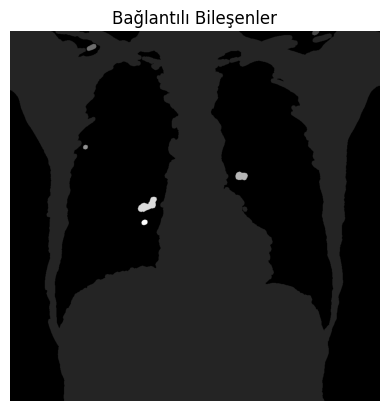

In [ ]:
# Bağlantılı Bileşen Analizi
for img_name in random_images:
    img_path = os.path.join("nih/images_small", img_name)
    if not os.path.exists(img_path):
        continue

    sample_image = io.imread(img_path)
    cropped_img = crop_image(sample_image)
    denoised_img = cv2.GaussianBlur(cropped_img, (5, 5), 0)
    binary_otsu = denoised_img > threshold_otsu(denoised_img)
    selem = morphology.disk(5)
    morphed_img = morphology.dilation(binary_otsu, selem)

    labeled_img = label(morphed_img)
    props = regionprops(labeled_img)

    print(f"Toplam Bölge Sayısı: {len(props)}")
    for i, prop in enumerate(props):
        print(f"Bölge {i+1}: Alan={prop.area}, Centroid={prop.centroid}, Eksen Oranı={prop.extent}")

    plt.imshow(labeled_img, cmap='gray')
    plt.title("Bağlantılı Bileşenler")
    plt.axis('off')
    plt.show()


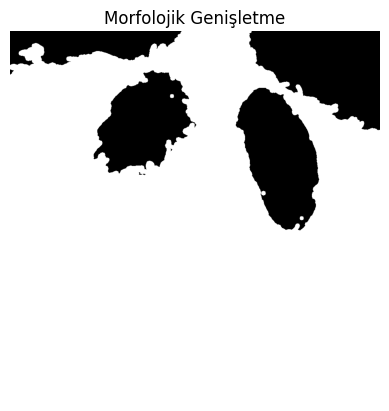

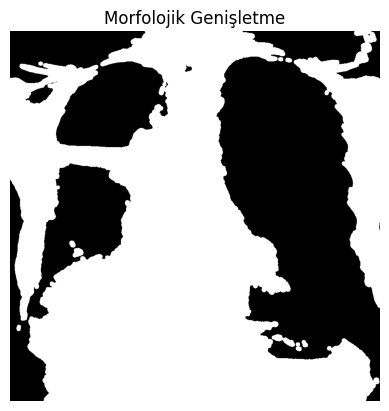

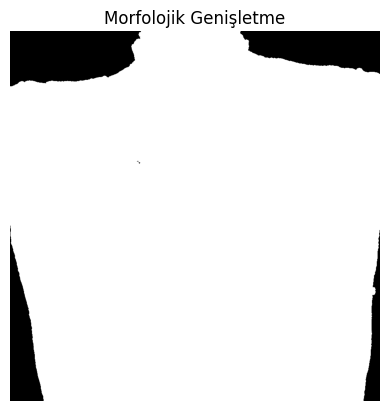

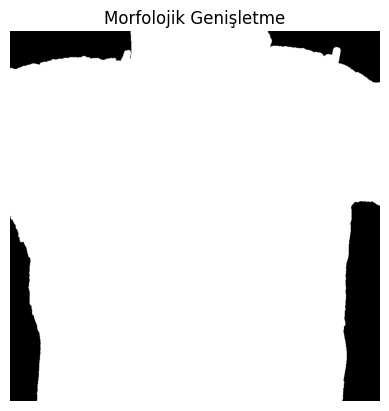

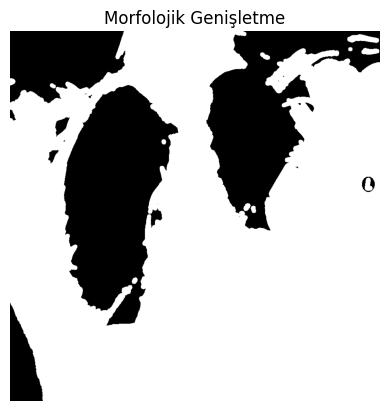

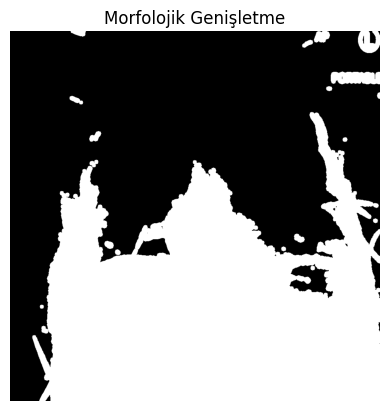

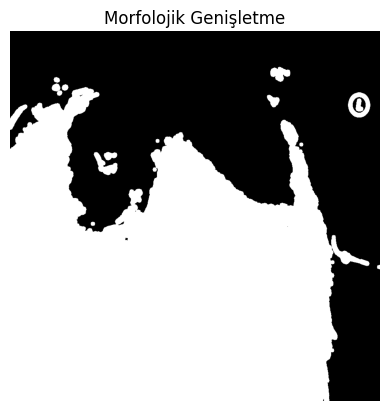

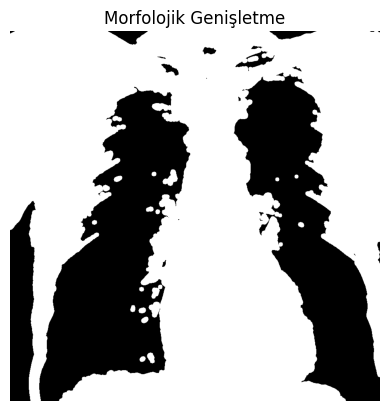

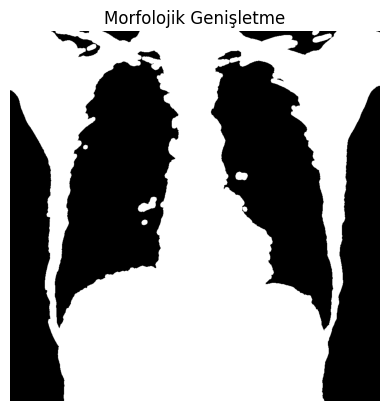

In [ ]:
# Morfolojik Genişletme
for img_name in random_images:
    img_path = os.path.join("nih/images_small", img_name)
    if not os.path.exists(img_path):
        continue

    sample_image = io.imread(img_path)
    cropped_img = crop_image(sample_image)
    denoised_img = cv2.GaussianBlur(cropped_img, (5, 5), 0)
    binary_otsu = denoised_img > threshold_otsu(denoised_img)
    selem = morphology.disk(5)
    morphed_img = morphology.dilation(binary_otsu, selem)

    plt.imshow(morphed_img, cmap='gray')
    plt.title("Morfolojik Genişletme")
    plt.axis('off')
    plt.show()

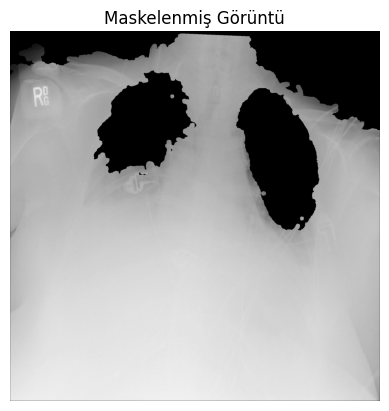

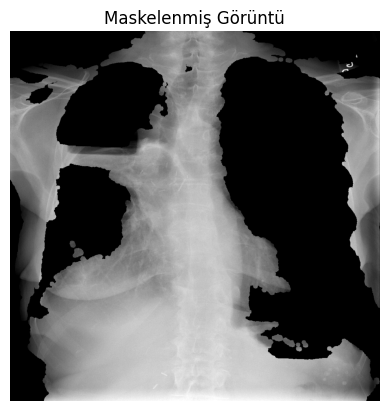

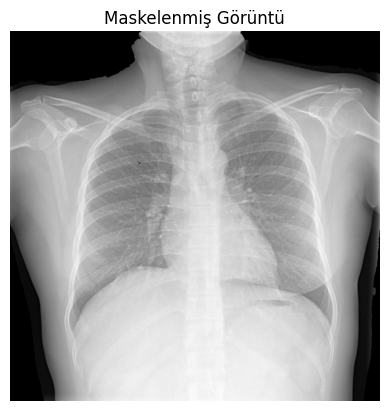

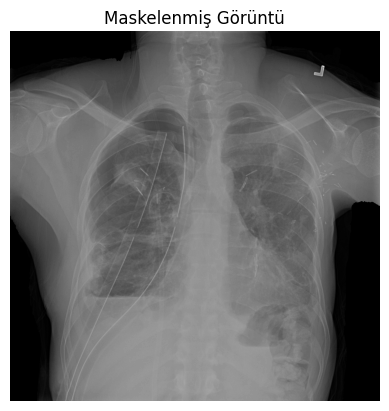

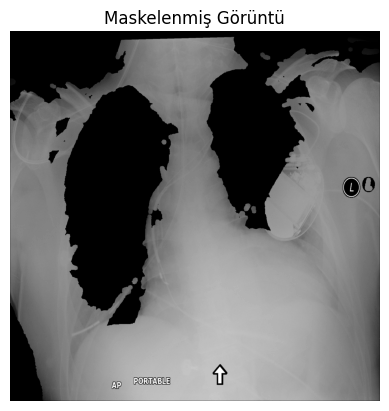

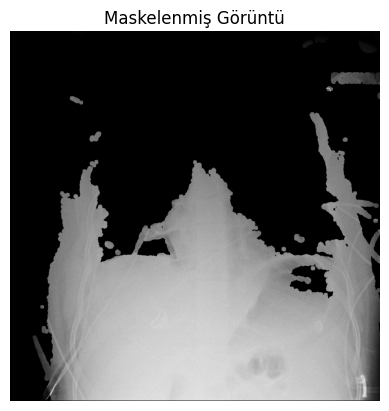

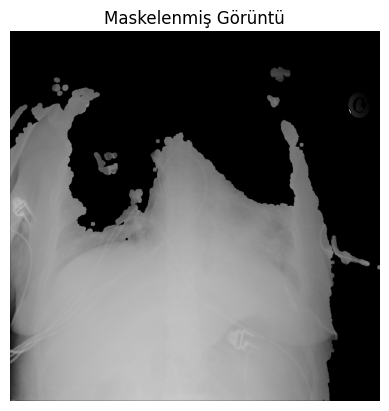

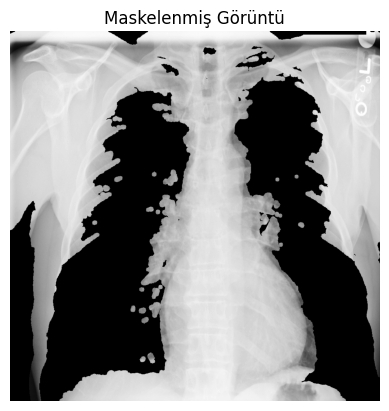

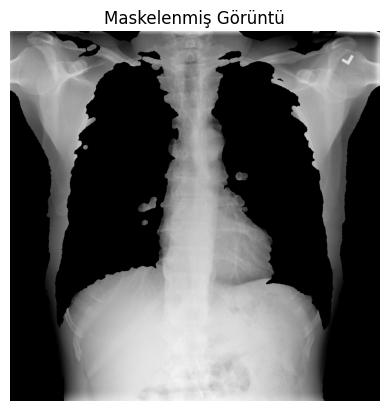

In [ ]:
# Maskelenmiş Görüntü
for img_name in random_images:
    img_path = os.path.join("nih/images_small", img_name)
    if not os.path.exists(img_path):
        continue

    sample_image = io.imread(img_path)
    cropped_img = crop_image(sample_image)
    denoised_img = cv2.GaussianBlur(cropped_img, (5, 5), 0)
    binary_otsu = denoised_img > threshold_otsu(denoised_img)
    selem = morphology.disk(5)
    morphed_img = morphology.dilation(binary_otsu, selem)

    morphed_img = morphed_img.astype(np.uint8)
    morphed_img_resized = cv2.resize(morphed_img, (sample_image.shape[1], sample_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    masked_image = sample_image * morphed_img_resized

    plt.imshow(masked_image, cmap='gray')
    plt.title("Maskelenmiş Görüntü")
    plt.axis('off')
    plt.show()
